In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score, StratifiedShuffleSplit


import matplotlib.pyplot as plt
from sklearn import metrics
import pandas as pd
import numpy as np
import cv2
import os

from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers import Conv2D, MaxPool2D
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import load_model

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [2]:
# Using function for code readbility

# loading images path and their respective shape and sign labels into dataframe
def load_training_data(folder = 'trafficsigns_dataset-1/trafficsigns_dataset'):
    data = pd.DataFrame(columns = ['shape', 'sign', 'path'])
    for subdir, dirs, files in os.walk(folder):
        for file in files:
            path = os.path.join(subdir, file)
            file_ext = os.path.splitext(path)[-1].lower()

            if (file_ext == '.png'):
                image = path
                label2 = path.split('\\')[-2]
                label1 = path.split('\\')[-3]

                data = data.append({'shape': label1, 'sign': label2, 'path' : image}, ignore_index=True)
    return data

#Plotting classes count for both shapes and sign
def plot_classes_count(df):
    fig = plt.figure(figsize=(16, 5))
    columns = 2
    rows = 1
    for i in range(0, columns * rows):
        fig.add_subplot(rows, columns, i + 1)
        if (i == 1):
            df['shape'].value_counts().plot.barh()
            plt.ylabel('Shape labels')
            plt.xlabel('Count')
        else:
            df['sign'].value_counts().plot.barh()
            plt.ylabel('Sign labels')
            plt.xlabel('Count')
    plt.show()
    
# Plotting images from our dataset    
def plot_images(df):
    df_percent = df.sample(frac=0.004).reset_index()
    fig = plt.figure(figsize=(13, 5))
    columns = 6
    rows = 2
    for i in range(0, columns * rows):
        fig.add_subplot(rows, columns, i + 1)
        im = cv2.imread(df_percent['path'][i], cv2.IMREAD_GRAYSCALE)
        plt.title("Shape : " + df_percent['shape'][i] + "\n" + "Sign : " + df_percent['sign'][i])
        plt.axis('off')
        plt.imshow(im, cmap = 'gray')
        
#flatten image for logistic regression and random forest        
def flatten_images(df):
    images_path = df['path']
    images = []

    for image in images_path:
        im = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
        images.append(im.flatten())

    df['image'] = images
    df = pd.concat([df, df['image'].apply(pd.Series)], axis = 1)
    df.drop(columns = ['path', 'image'], inplace =True)
    return df


# Label encoding our categorical target variable
def label_encoding(y):
    le = LabelEncoder()
    y = le.fit_transform(y)  
    return y, le

#converting image to array for CNN
def convert_images_to_array(df):
    images_path = df['path']
    images = []

    for image in images_path:
        im = cv2.imread(image, cv2.IMREAD_UNCHANGED)
        if (im.shape[0] < 28):
            im = cv2.resize(im, (28, 28))
        im = im[..., np.newaxis]
        im = im.astype(np.float32)
        im /= 255.0 
        images.append(im)
        

    images = np.array(images)
    return images

#Plotting CNN training and validation accuracy plus loss
def plot_loss_and_accuracy(history):
    plt.figure(0)
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='val accuracy')
    plt.title('Accuracy')
    plt.xlabel('epochs')
    plt.ylabel('accuracy')
    plt.legend()

    plt.figure(1)
    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='val loss')
    plt.title('Loss')
    plt.xlabel('epochs')
    plt.ylabel('loss')
    plt.legend()
    plt.show()
    

# Reading dataset form folder for independent evaluatin
def read_test_dataset(folder):
    df = pd.DataFrame(columns = ['shape', 'path'])
    for subdir, dirs, files in os.walk(folder):
        for file in files:
            path = os.path.join(subdir, file)
            file_ext = os.path.splitext(path)[-1].lower()
            if (file_ext == '.png' or file_ext == '.jpg'):
                image = path
                label1 = path.split('\\')[-2]            
                df = df.append({'shape': label1, 'path' : image}, ignore_index=True)
                
    return df

# Loading Training Data

In [3]:
# loading images path and their respective shape and sign labels into dataframe
training_data = load_training_data()

# Data Exploration

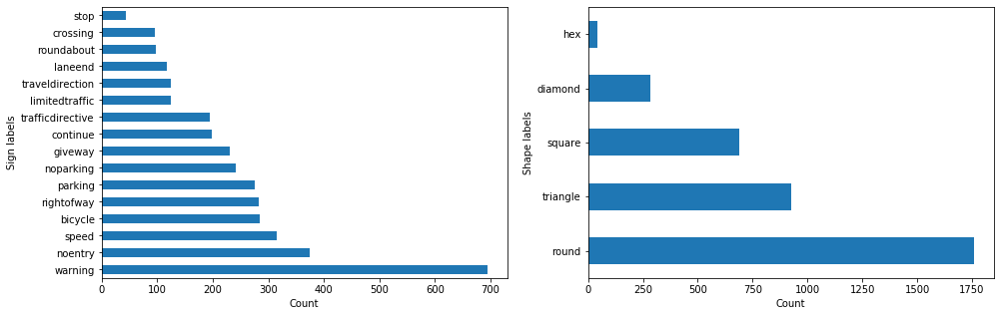

In [4]:
# Plotting class count for both shapes and sign data
plot_classes_count(training_data)

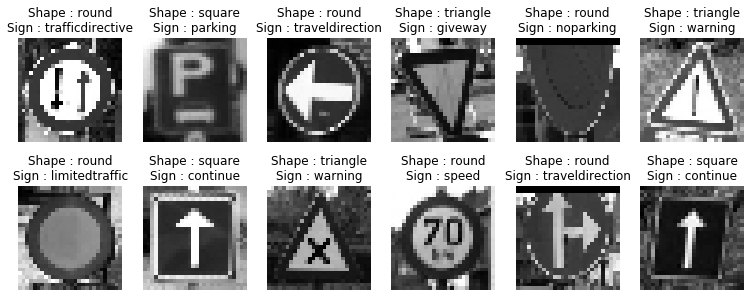

In [5]:
# Plotting images from our dataset
plot_images(training_data)

### Data PreProcessing for Logistic Regression and Random Forest

In [6]:
# Flattening our images So we can input it to our models
train_df = flatten_images(training_data)

X = train_df.drop(columns = ['shape', 'sign'])
y_shape = train_df['shape']
y_sign = train_df['sign']

In [7]:
# Label encoding our categorical target variables to numerical form
y_shape, le_shape = label_encoding(y_shape)
y_sign, le_sign = label_encoding(y_sign)

# Logistic Regression

In [8]:
# Intilaizing our logistic regression model and k value for cross validation
k = 10
cv = StratifiedShuffleSplit(n_splits = k, test_size = 0.2, random_state = 0)
model = LogisticRegression()

### Shape classification

In [9]:
# Training our logistic regression using k fold cross validation
shape_scores = cross_val_score(model, X, y_shape, cv = cv, scoring='f1_micro', n_jobs = -1)

In [10]:
logistic_shape_score = shape_scores.mean()
print ("Logistic regression f1 score for traffic shapes : ", round(logistic_shape_score, 4))

Logistic regression f1 score for traffic shapes :  0.9423


### Sign classification

In [11]:
# Training our logistic regression using cross validation
sign_scores = cross_val_score(model, X, y_sign, cv = cv, scoring='f1_micro', n_jobs = -1)

In [12]:
logistic_sign_score = sign_scores.mean()
print ("Logistic regression f1 score for traffic signs : ", round(logistic_sign_score, 4))

Logistic regression f1 score for traffic signs :  0.9439


# Random Forest

In [13]:
#Tuning Random Forest Classifier hyperparameter using GridSearch and k fold cross validation
def rf_hyperparamter_tuning(X, y):
    
    param_grid = {
    'max_depth': [5, 7, 9, 11],
    'n_estimators': [200, 300, 500, 1000]
    }
    
    clf = RandomForestClassifier(random_state=0)
    
    # grid search model
    grid_search = GridSearchCV(estimator = clf, param_grid = param_grid, 
                          cv = cv, n_jobs = -1, verbose = 2, scoring= 'f1_micro')
    
    grid_search.fit(X, y)
                               
    return grid_search

### Shape Classification

In [14]:
result = rf_hyperparamter_tuning(X, y_shape)

Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:  6.4min finished


In [15]:
rf_shape_score = round(result.best_score_, 4)
print ("Best Parameters for Shape Classifier for Random Forest : ", result.best_params_)
print ("Random Forest f1 score for traffic shapes :", rf_shape_score)

Best Parameters for Shape Classifier for Random Forest :  {'max_depth': 11, 'n_estimators': 300}
Random Forest f1 score for traffic shapes : 0.9614


### Sign Classification

In [16]:
result = rf_hyperparamter_tuning(X, y_sign)

Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:  7.1min finished


In [17]:
rf_sign_score = round(result.best_score_, 4)
print ("Best Parameters for Shape Classifier for Random Forest : ", result.best_params_)
print ("Random Forest f1 score for traffic sign :", rf_sign_score)

Best Parameters for Shape Classifier for Random Forest :  {'max_depth': 11, 'n_estimators': 1000}
Random Forest f1 score for traffic sign : 0.9509


# Convolutional Neural Network

### Data Preprocessing and Data Normalization

In [18]:
# Data Preprocessing: read image and convert them to numpy array of shape (28,28,1) and after that normalizing them between 0 and 1
X = convert_images_to_array(training_data)

shape_classes = np.unique(y_shape).shape[0]
sign_classes = np.unique(y_sign).shape[0]

X = convert_images_to_array(training_data)
y_shapes = keras.utils.to_categorical(y_shape, shape_classes)
y_signs = keras.utils.to_categorical(y_sign, sign_classes)


#### Spliting the data into training and validation for both traffic shapes and signs

In [19]:
#Spliting data into training and validation by 80/20% in stratified fashion for both traffic shape and signs
X_train_shape, X_val_shape, y_train_shape, y_val_shape = train_test_split(X, y_shapes, test_size=0.2, stratify = y_shapes, random_state = 42, shuffle = True)
X_train_sign, X_val_sign, y_train_sign, y_val_sign = train_test_split(X, y_signs, test_size=0.2, stratify = y_sign, random_state = 42, shuffle = True)

In [20]:
# Defining our Convolutional Neural Network
def build_model(n_classes, input_shape):
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=(5, 5), activation='relu', input_shape= input_shape))

    model.add(Conv2D(filters=64, kernel_size=(3, 3)))
    model.add(Activation("relu"))
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(rate=0.25))

    model.add(Conv2D(filters=64, kernel_size=(3, 3)))
    model.add(Activation("relu"))
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(rate=0.25))

    model.add(Flatten())
    model.add(Dense(200, activation='relu'))

    model.add(Dropout(rate=0.5))
    model.add(Dense(n_classes, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

### Shape Classification

In [21]:
# Creating model instance
model = build_model(shape_classes, (28, 28, 1))

#Displaying model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 24, 24, 32)        832       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 22, 22, 64)        18496     
_________________________________________________________________
activation_1 (Activation)    (None, 22, 22, 64)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 11, 11, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 11, 11, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 9, 9, 64)          36928     
_________________________________________________________________
activation_2 (Activation)    (None, 9, 9, 64)         

In [22]:
# using 20 epochs for the training and saving the accuracy for each epoch
epochs = 20

#Stopping model if validation accuracy remain sames for 5 epochs straight
callback = ModelCheckpoint(filepath="./saved_model/shape.hdf5", monitor="val_accuracy", verbose=0,
        save_best_only=True, mode="auto")

es = EarlyStopping(monitor = 'val_accuracy', mode = 'max', verbose = 2, patience = 5)

#Training our model
history = model.fit(X_train_shape, y_train_shape, batch_size = 64, epochs = epochs, verbose = 2, callbacks = [es, callback],
          validation_data = (X_val_shape, y_val_shape))

Train on 2959 samples, validate on 740 samples
Epoch 1/20
 - 3s - loss: 1.1212 - accuracy: 0.5674 - val_loss: 0.7098 - val_accuracy: 0.7811
Epoch 2/20
 - 1s - loss: 0.4611 - accuracy: 0.8560 - val_loss: 0.2720 - val_accuracy: 0.9257
Epoch 3/20
 - 1s - loss: 0.2016 - accuracy: 0.9338 - val_loss: 0.1306 - val_accuracy: 0.9608
Epoch 4/20
 - 1s - loss: 0.1209 - accuracy: 0.9601 - val_loss: 0.0823 - val_accuracy: 0.9676
Epoch 5/20
 - 1s - loss: 0.0857 - accuracy: 0.9753 - val_loss: 0.0627 - val_accuracy: 0.9797
Epoch 6/20
 - 1s - loss: 0.0561 - accuracy: 0.9824 - val_loss: 0.0453 - val_accuracy: 0.9784
Epoch 7/20
 - 1s - loss: 0.0435 - accuracy: 0.9861 - val_loss: 0.0345 - val_accuracy: 0.9905
Epoch 8/20
 - 1s - loss: 0.0329 - accuracy: 0.9882 - val_loss: 0.0277 - val_accuracy: 0.9959
Epoch 9/20
 - 1s - loss: 0.0277 - accuracy: 0.9916 - val_loss: 0.0220 - val_accuracy: 0.9932
Epoch 10/20
 - 1s - loss: 0.0366 - accuracy: 0.9878 - val_loss: 0.0218 - val_accuracy: 0.9946
Epoch 11/20
 - 1s - lo

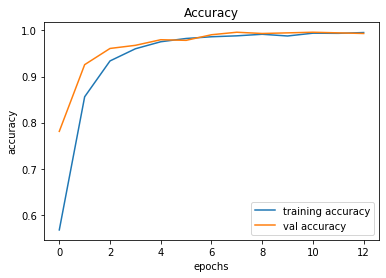

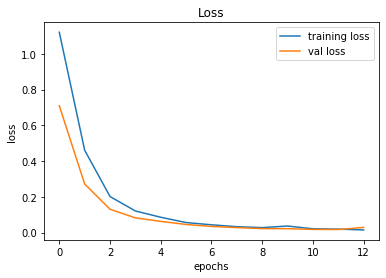

In [23]:
# Plotting our model training and validation accuracyand loss
plot_loss_and_accuracy(history)

### Sign Classification

In [24]:
# Creating model instance
model = build_model(sign_classes, (28, 28, 1))

#Displaying model summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 24, 24, 32)        832       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 22, 22, 64)        18496     
_________________________________________________________________
activation_3 (Activation)    (None, 22, 22, 64)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 11, 11, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 11, 11, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 9, 9, 64)          36928     
_________________________________________________________________
activation_4 (Activation)    (None, 9, 9, 64)         

In [25]:
# using 20 epochs for the training
epochs = 20

#Stopping model if validation accuracy remain sames for 5 epochs straight and saving model also
callback = ModelCheckpoint(filepath="./saved_model/sign.hdf5", monitor="val_accuracy", verbose=0,
        save_best_only=True, mode="auto")

es = EarlyStopping(monitor = 'val_accuracy', mode = 'max', verbose = 2, patience = 5)

#Training our model
history = model.fit(X_train_sign, y_train_sign, batch_size = 64, epochs = epochs, verbose = 2, callbacks = [es, callback],
          validation_data = (X_val_sign, y_val_sign))

Train on 2959 samples, validate on 740 samples
Epoch 1/20
 - 1s - loss: 2.1483 - accuracy: 0.3552 - val_loss: 0.9842 - val_accuracy: 0.7581
Epoch 2/20
 - 1s - loss: 0.7174 - accuracy: 0.7972 - val_loss: 0.3142 - val_accuracy: 0.9230
Epoch 3/20
 - 1s - loss: 0.3445 - accuracy: 0.9037 - val_loss: 0.1849 - val_accuracy: 0.9514
Epoch 4/20
 - 1s - loss: 0.2442 - accuracy: 0.9338 - val_loss: 0.1515 - val_accuracy: 0.9608
Epoch 5/20
 - 1s - loss: 0.1591 - accuracy: 0.9523 - val_loss: 0.1069 - val_accuracy: 0.9676
Epoch 6/20
 - 1s - loss: 0.1371 - accuracy: 0.9588 - val_loss: 0.0942 - val_accuracy: 0.9703
Epoch 7/20
 - 1s - loss: 0.1192 - accuracy: 0.9672 - val_loss: 0.0838 - val_accuracy: 0.9676
Epoch 8/20
 - 1s - loss: 0.0848 - accuracy: 0.9760 - val_loss: 0.0659 - val_accuracy: 0.9824
Epoch 9/20
 - 1s - loss: 0.0706 - accuracy: 0.9753 - val_loss: 0.0495 - val_accuracy: 0.9797
Epoch 10/20
 - 1s - loss: 0.0698 - accuracy: 0.9763 - val_loss: 0.0478 - val_accuracy: 0.9865
Epoch 11/20
 - 1s - lo

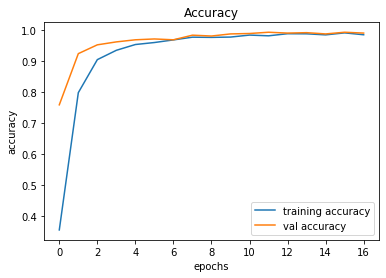

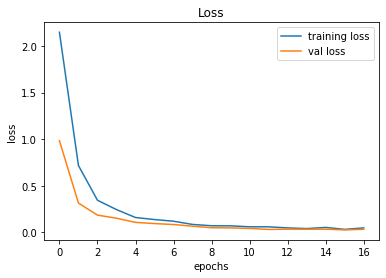

In [26]:
# Plotting our model training and validation accuracyand loss
plot_loss_and_accuracy(history)

## Saving label encoding for shapes and signs classes

In [35]:
np.save('shapes.npy', le_shape.classes_)
np.save('signs.npy', le_sign.classes_)

# INDEPENDENT EVALUATION Using Convolutional Neural Network

### Loading our label encoding for shapes and signs 

In [38]:
np_load_old = np.load

# modify the default parameters of np.load
np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)


le_shape = LabelEncoder()
le_shape.classes_ = np.load('shapes.npy')

le_sign = LabelEncoder()
le_sign.classes_ = np.load('signs.npy')

# restore np.load for future normal usage
np.load = np_load_old

### Shape

In [74]:
#Loading our cnn model for shape
shape_model = load_model('./saved_model/shape.hdf5')

In [75]:
# Reading our shape independent evaluation dataset
path = 'shape_test_data'
test_df = read_test_dataset(path)

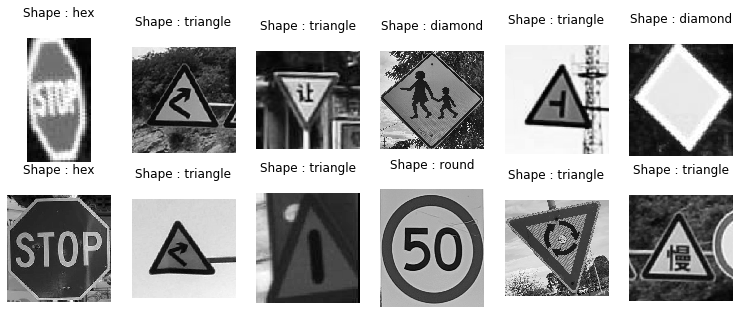

In [76]:
# Displaying random images independent evaluation data 
test_df = test_df.sample(frac = 1).reset_index()
fig = plt.figure(figsize=(13, 5))
columns = 6
rows = 2
for i in range(0, columns * rows):
    fig.add_subplot(rows, columns, i + 1)
    im = cv2.imread(test_df['path'][i], cv2.IMREAD_GRAYSCALE)
    plt.title("Shape : " + test_df['shape'][i] + "\n")
    plt.axis('off')
    plt.imshow(im, cmap = 'gray')

Actual : hex
Predicted :  hex


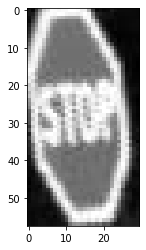

Actual : triangle
Predicted :  triangle


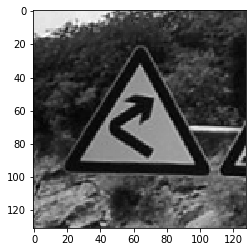

Actual : triangle
Predicted :  triangle


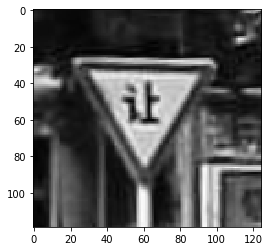

Actual : diamond
Predicted :  round


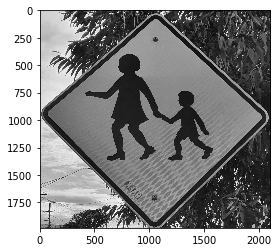

Actual : triangle
Predicted :  triangle


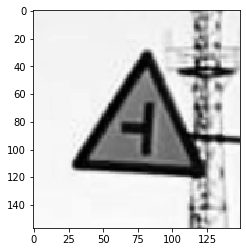

Actual : diamond
Predicted :  diamond


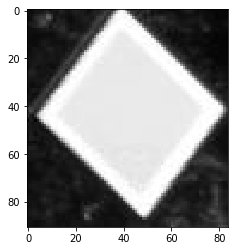

Actual : hex
Predicted :  hex


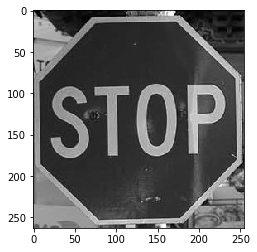

Actual : triangle
Predicted :  triangle


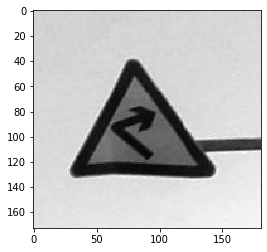

Actual : triangle
Predicted :  triangle


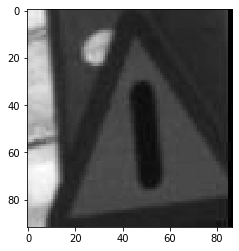

Actual : round
Predicted :  round


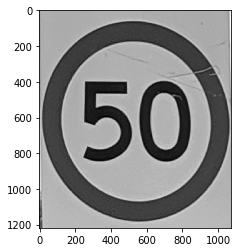

Actual : triangle
Predicted :  triangle


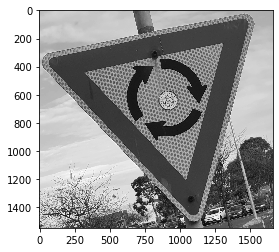

Actual : triangle
Predicted :  triangle


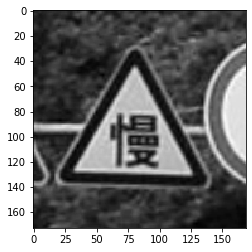

Actual : round
Predicted :  round


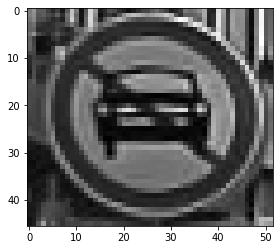

Actual : round
Predicted :  round


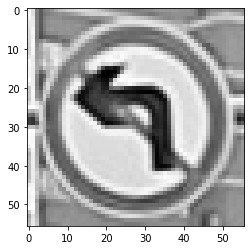

Actual : triangle
Predicted :  triangle


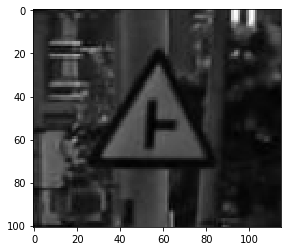

Actual : diamond
Predicted :  round


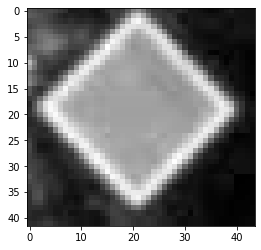

Actual : hex
Predicted :  hex


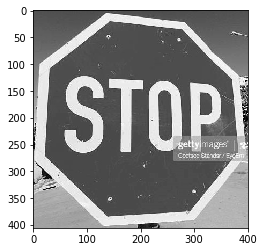

Actual : triangle
Predicted :  triangle


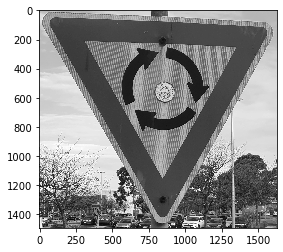

Actual : round
Predicted :  round


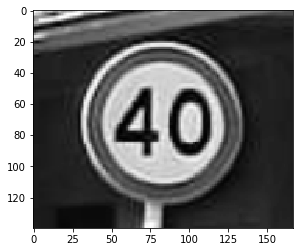

Actual : round
Predicted :  round


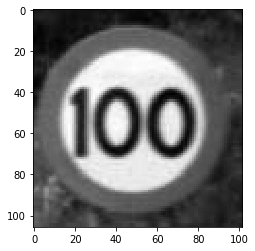

Actual : round
Predicted :  round


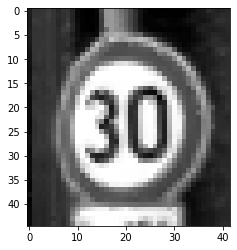

Actual : hex
Predicted :  hex


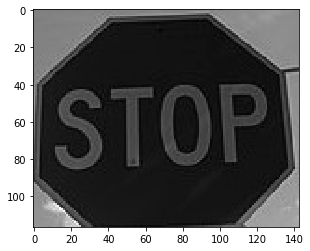

Actual : diamond
Predicted :  round


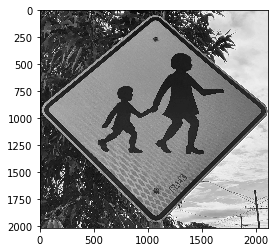

Actual : triangle
Predicted :  triangle


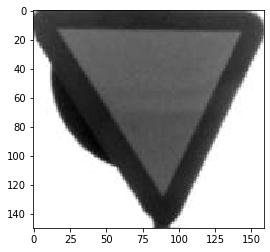

Actual : round
Predicted :  round


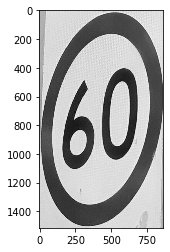

Actual : round
Predicted :  round


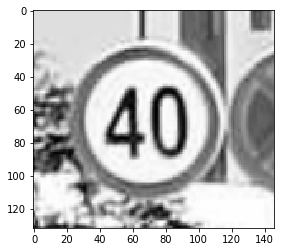

Actual : triangle
Predicted :  triangle


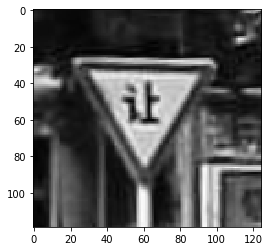

Actual : triangle
Predicted :  triangle


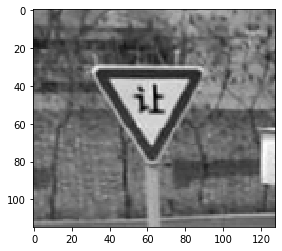

Actual : triangle
Predicted :  triangle


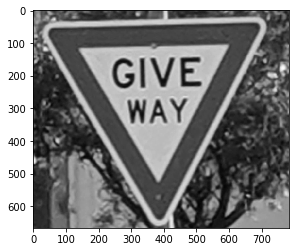

Actual : round
Predicted :  triangle


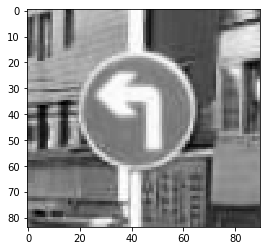

Actual : triangle
Predicted :  triangle


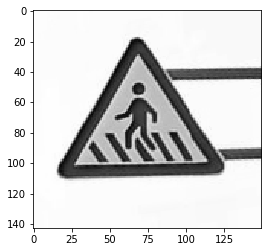

Actual : triangle
Predicted :  triangle


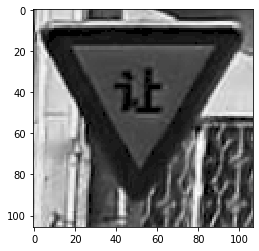

Actual : triangle
Predicted :  triangle


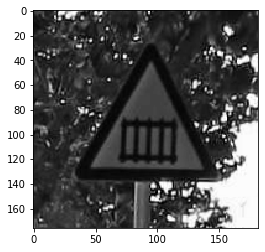

Actual : triangle
Predicted :  triangle


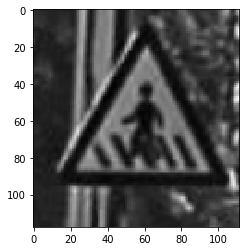

Actual : triangle
Predicted :  triangle


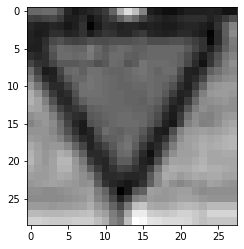

Actual : diamond
Predicted :  diamond


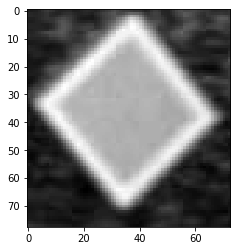

Actual : triangle
Predicted :  triangle


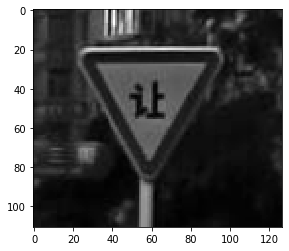

Actual : triangle
Predicted :  triangle


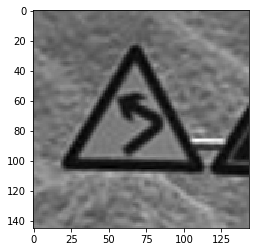

Actual : round
Predicted :  round


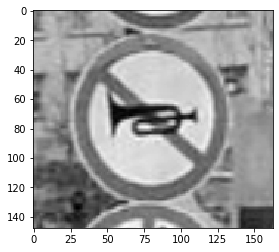

Actual : round
Predicted :  round


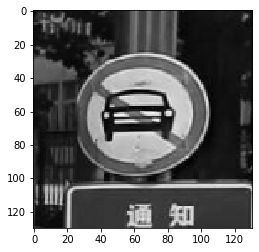

Actual : hex
Predicted :  triangle


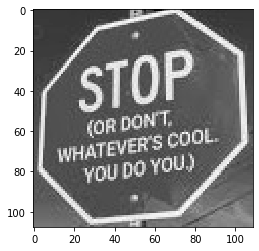

Actual : triangle
Predicted :  triangle


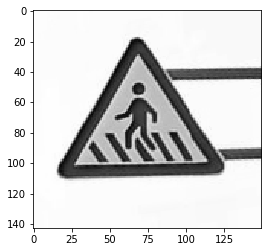

Actual : round
Predicted :  round


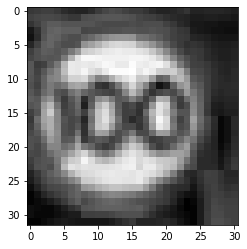

Actual : triangle
Predicted :  triangle


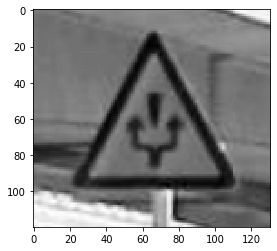

Actual : triangle
Predicted :  triangle


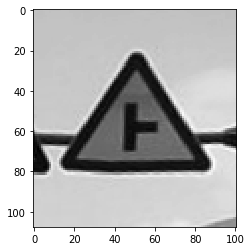

Actual : round
Predicted :  round


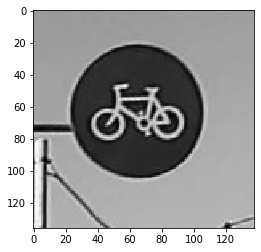

Actual : round
Predicted :  triangle


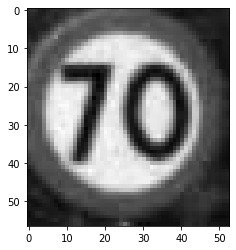

Actual : round
Predicted :  round


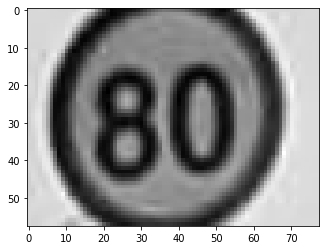

Actual : triangle
Predicted :  triangle


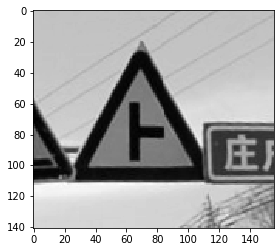

Actual : triangle
Predicted :  triangle


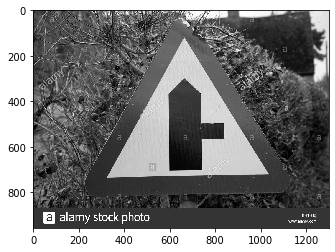

Actual : hex
Predicted :  hex


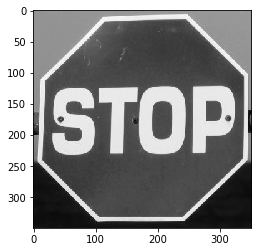

Actual : triangle
Predicted :  triangle


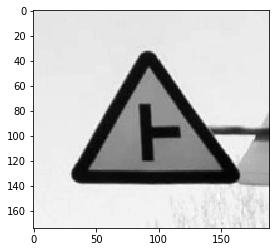

Actual : round
Predicted :  round


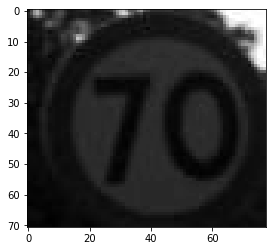

Actual : round
Predicted :  round


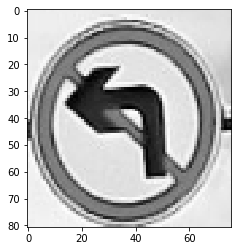

Actual : round
Predicted :  round


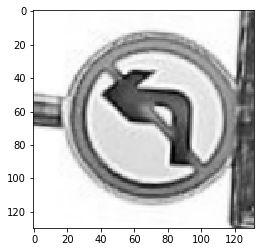

Actual : hex
Predicted :  round


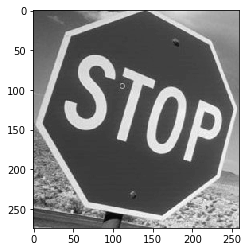

Actual : triangle
Predicted :  triangle


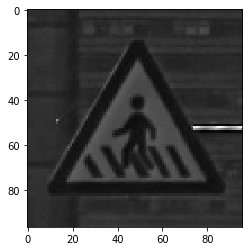

Actual : triangle
Predicted :  triangle


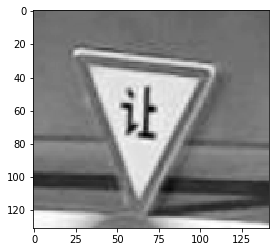

Actual : round
Predicted :  round


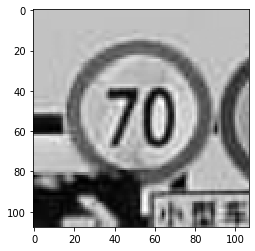

Actual : triangle
Predicted :  triangle


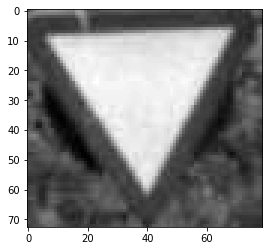

Actual : round
Predicted :  triangle


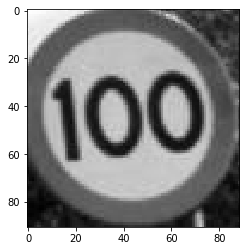

Actual : triangle
Predicted :  triangle


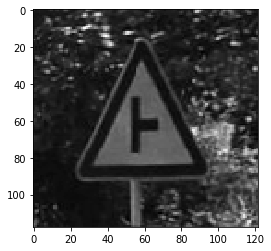

Actual : triangle
Predicted :  triangle


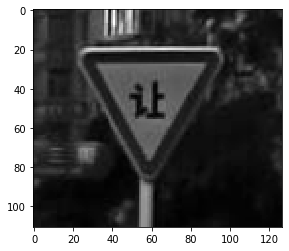

Actual : round
Predicted :  triangle


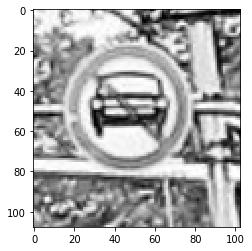

Actual : triangle
Predicted :  triangle


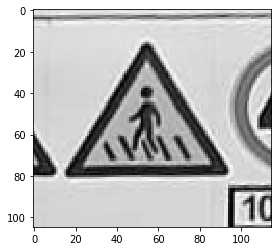

Actual : round
Predicted :  round


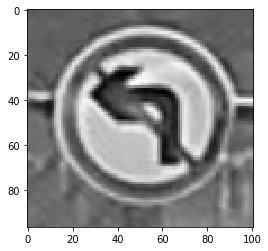

Actual : triangle
Predicted :  triangle


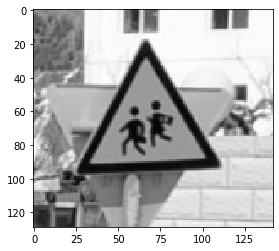

Actual : hex
Predicted :  hex


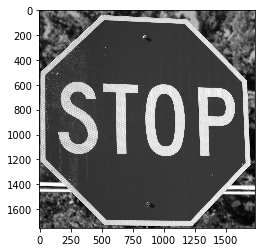

Actual : triangle
Predicted :  triangle


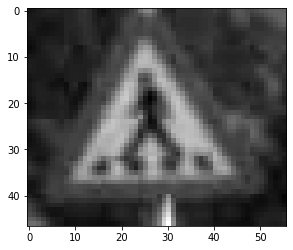

Actual : diamond
Predicted :  diamond


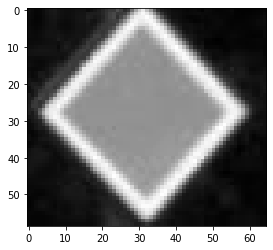

Actual : round
Predicted :  round


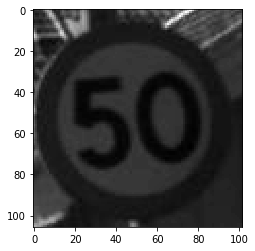

Actual : round
Predicted :  triangle


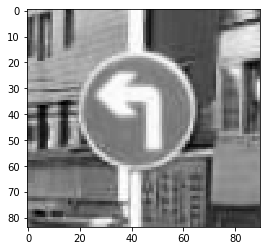

Actual : triangle
Predicted :  triangle


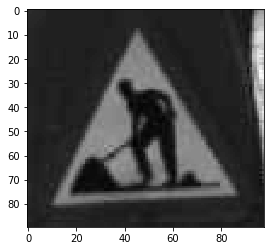

Actual : triangle
Predicted :  triangle


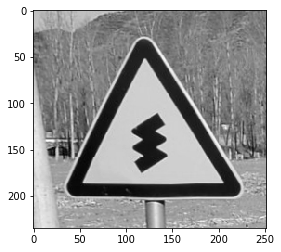

Actual : triangle
Predicted :  triangle


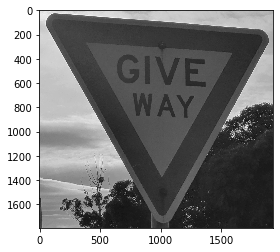

Actual : round
Predicted :  round


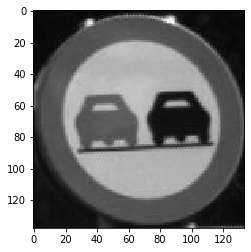

Actual : triangle
Predicted :  round


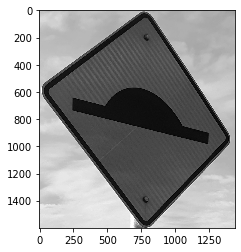

Actual : round
Predicted :  round


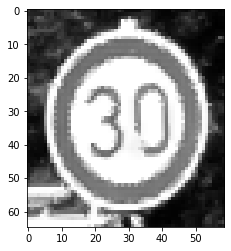

Actual : round
Predicted :  round


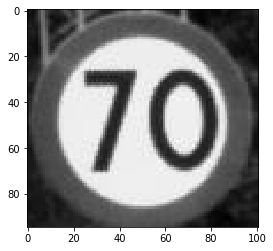

Actual : round
Predicted :  square


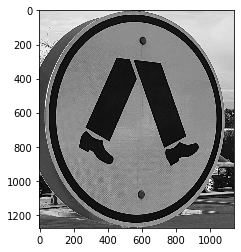

Actual : triangle
Predicted :  triangle


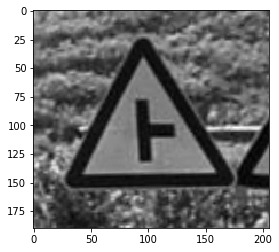

Actual : round
Predicted :  round


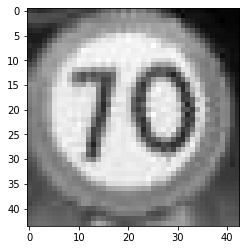

Actual : hex
Predicted :  hex


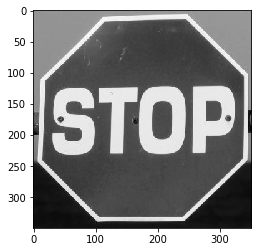

Actual : round
Predicted :  round


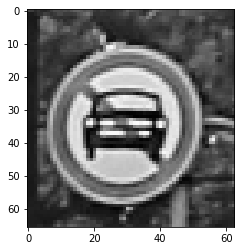

Actual : round
Predicted :  round


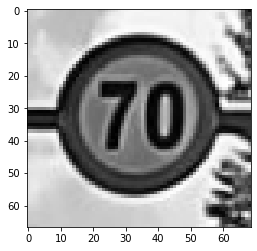

Actual : triangle
Predicted :  triangle


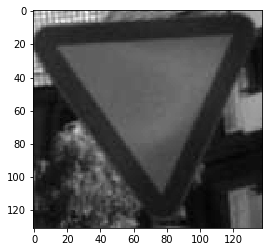

Actual : triangle
Predicted :  round


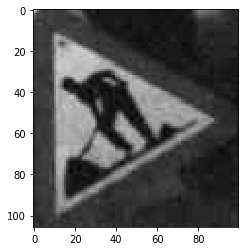

Actual : round
Predicted :  round


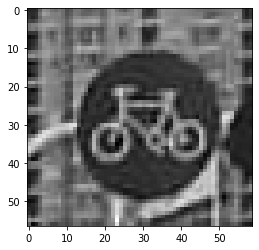

Actual : triangle
Predicted :  triangle


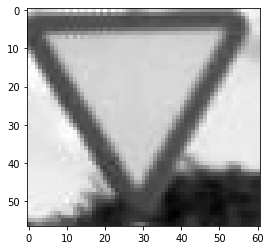

Actual : round
Predicted :  round


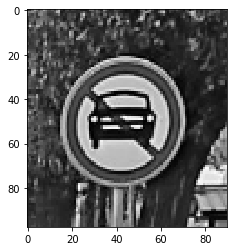

Actual : round
Predicted :  round


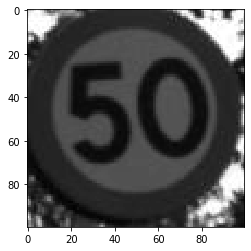

Actual : triangle
Predicted :  triangle


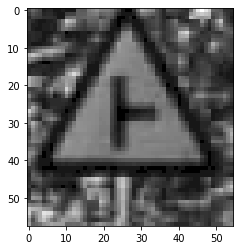

Actual : triangle
Predicted :  triangle


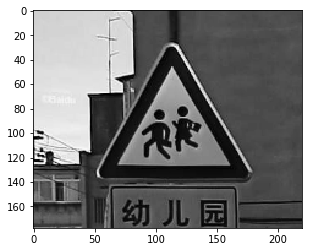

Actual : triangle
Predicted :  hex


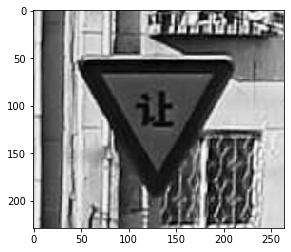

Actual : round
Predicted :  round


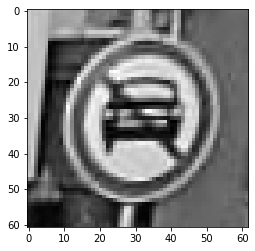

Actual : round
Predicted :  round


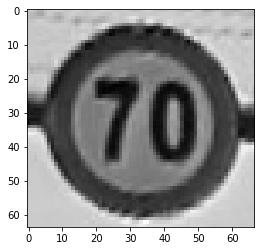

Actual : round
Predicted :  round


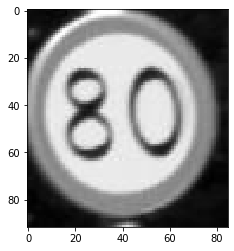

Actual : round
Predicted :  round


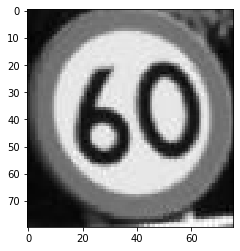

Actual : triangle
Predicted :  triangle


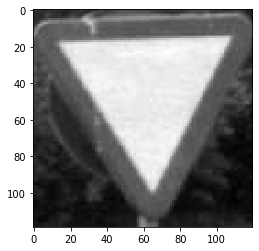

Actual : hex
Predicted :  hex


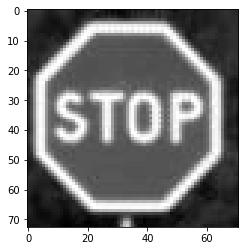

Actual : round
Predicted :  triangle


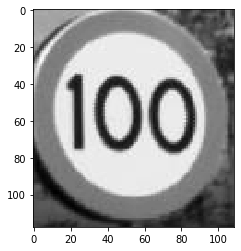

Actual : triangle
Predicted :  triangle


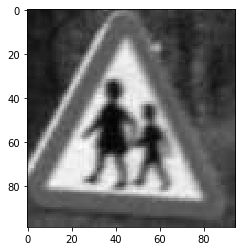

Actual : triangle
Predicted :  diamond


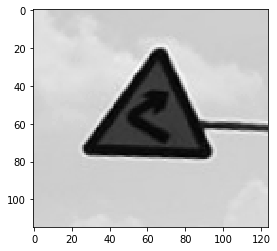

Actual : triangle
Predicted :  triangle


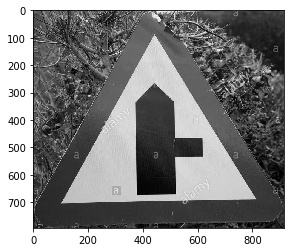

Actual : round
Predicted :  triangle


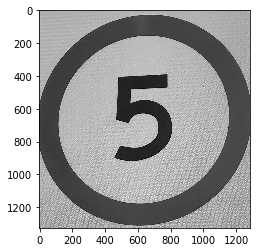

Actual : triangle
Predicted :  diamond


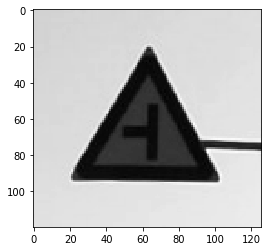

Actual : triangle
Predicted :  triangle


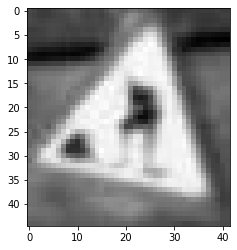

Actual : round
Predicted :  round


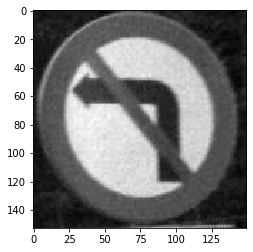

Actual : triangle
Predicted :  triangle


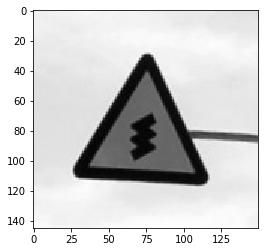

Actual : round
Predicted :  round


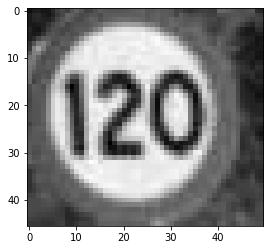

Actual : round
Predicted :  square


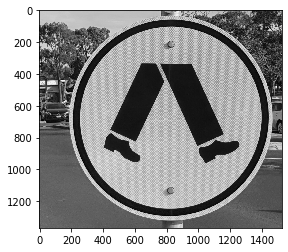

Actual : round
Predicted :  square


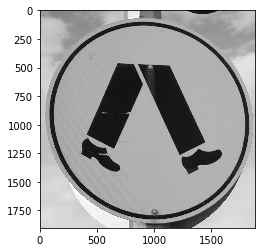

Actual : diamond
Predicted :  diamond


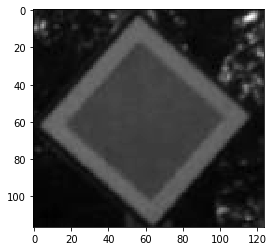

Actual : round
Predicted :  round


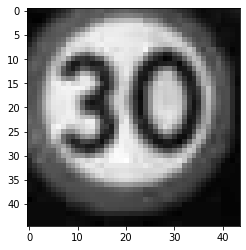

Actual : triangle
Predicted :  triangle


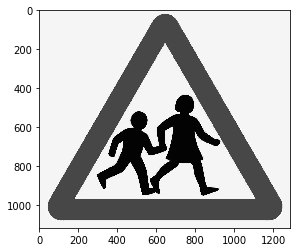

Actual : hex
Predicted :  hex


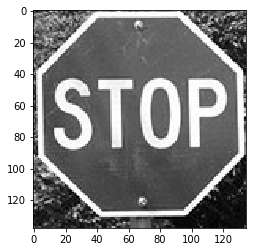

Actual : triangle
Predicted :  triangle


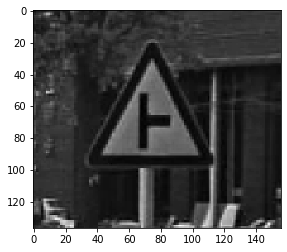

Actual : diamond
Predicted :  round


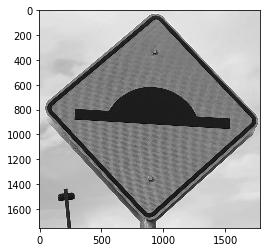

Actual : triangle
Predicted :  triangle


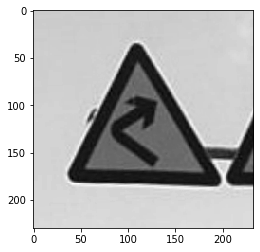

Actual : round
Predicted :  round


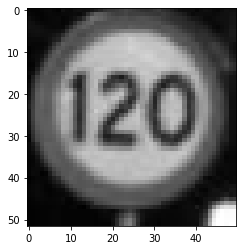

Actual : triangle
Predicted :  round


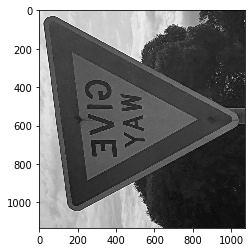

Actual : round
Predicted :  round


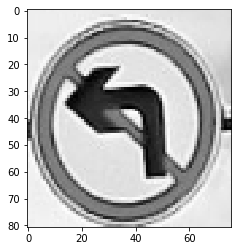

Actual : round
Predicted :  round


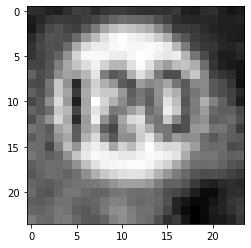

Actual : round
Predicted :  round


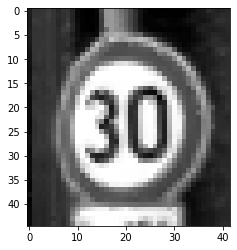

Actual : round
Predicted :  round


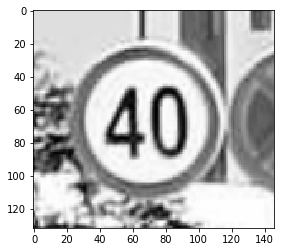

Actual : triangle
Predicted :  triangle


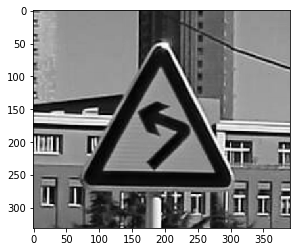

Actual : triangle
Predicted :  square


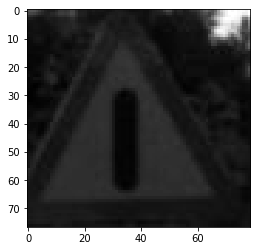

Actual : triangle
Predicted :  triangle


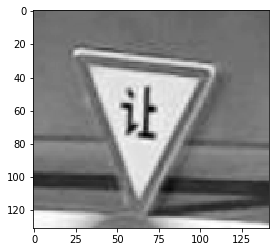

Actual : triangle
Predicted :  round


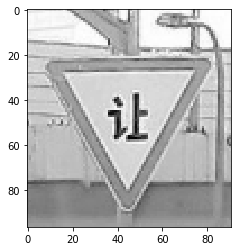

Actual : diamond
Predicted :  round


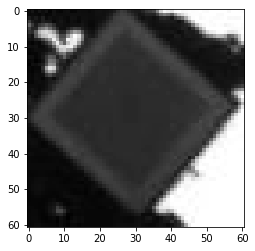

Actual : triangle
Predicted :  square


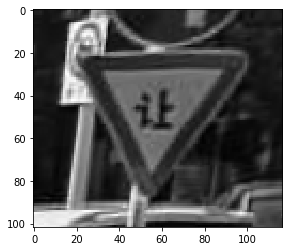

Actual : round
Predicted :  round


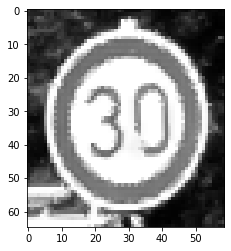

Actual : round
Predicted :  round


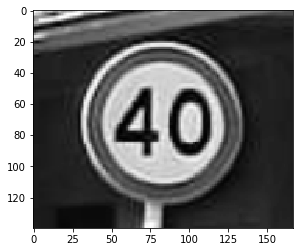

Actual : round
Predicted :  triangle


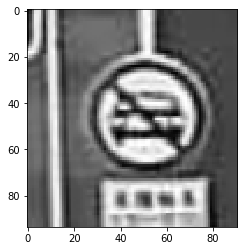

Actual : round
Predicted :  round


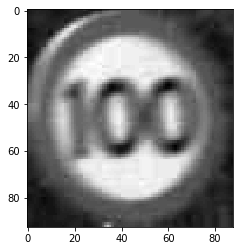

Actual : round
Predicted :  round


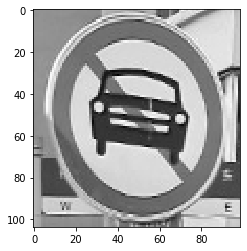

Actual : diamond
Predicted :  round


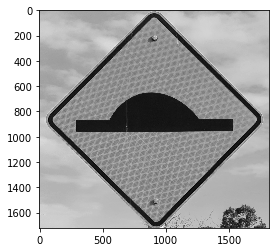

Actual : triangle
Predicted :  round


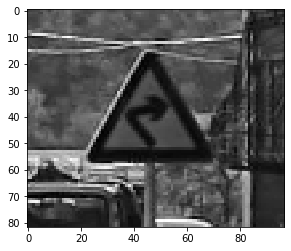

Actual : triangle
Predicted :  triangle


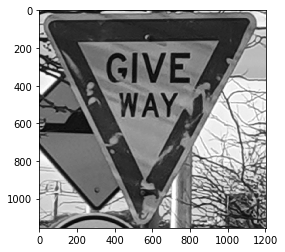

Actual : hex
Predicted :  hex


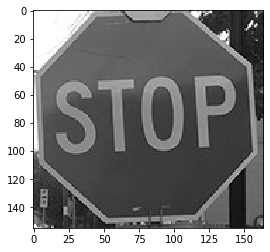

In [77]:
# Randomly displaying image from our independent data set
y_predicted_shape = []

for row in test_df.itertuples(index=True, name='Pandas'):
    test_img = cv2.imread(row.path, cv2.IMREAD_GRAYSCALE)
    plt.imshow(test_img, cmap = 'gray')
    
    test_img = cv2.resize(test_img, (28, 28))
    test_img = test_img[..., np.newaxis]
    test_img = test_img[np.newaxis,].astype(np.float)
    test_img /= 255.0
    
    temp = np.argmax(shape_model.predict(test_img))
    y_predicted_shape.append(le_shape.classes_[temp])
    print ("Actual :", row.shape)
    print ("Predicted : ",le_shape.classes_[temp])
    plt.show()

In [78]:
# Displaying f1 score on shape dataset
print ("F1 score on shape test set : ",f1_score(test_df['shape'].tolist(), y_predicted_shape, average = 'micro'))

F1 score on shape test set :  0.7928571428571428


### Sign

In [79]:
#Loading our cnn model for sign
sign_model = load_model('./saved_model/sign.hdf5')

In [80]:
# Reading our shape independent evaluation dataset
path = 'sign_test_data'
test_df = load_training_data('sign_test_data')

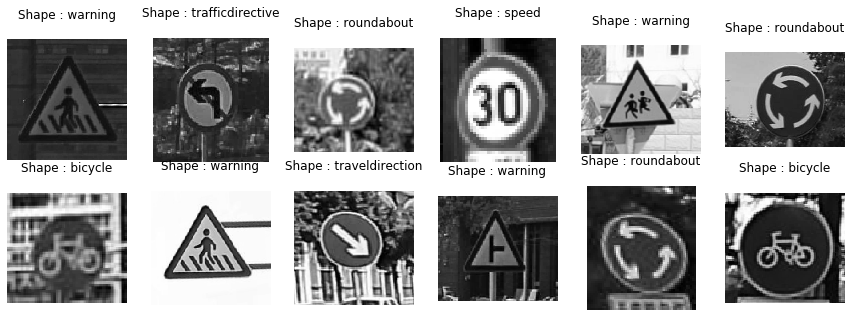

In [81]:
# Displaying random images independent evaluation data 
test_df = test_df.sample(frac = 1).reset_index()
fig = plt.figure(figsize=(15, 5))
columns = 6
rows = 2
for i in range(0, columns * rows):
    fig.add_subplot(rows, columns, i + 1)
    im = cv2.imread(test_df['path'][i], cv2.IMREAD_GRAYSCALE)
    plt.title("Shape : " + test_df['sign'][i] + "\n")
    plt.axis('off')
    plt.imshow(im, cmap = 'gray')

Actual : warning
Predicted :  warning


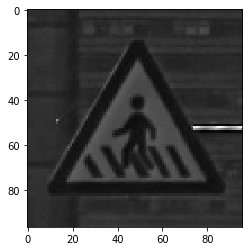

Actual : trafficdirective
Predicted :  warning


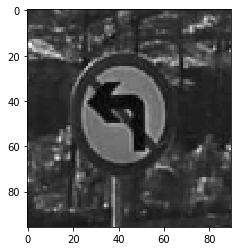

Actual : roundabout
Predicted :  warning


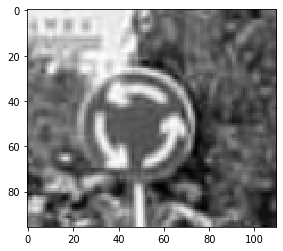

Actual : speed
Predicted :  speed


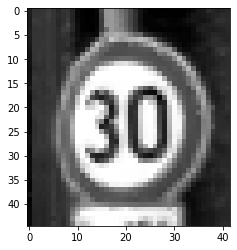

Actual : warning
Predicted :  warning


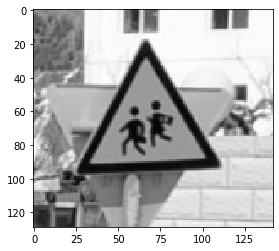

Actual : roundabout
Predicted :  roundabout


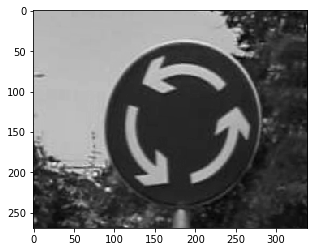

Actual : bicycle
Predicted :  bicycle


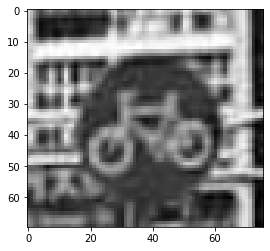

Actual : warning
Predicted :  warning


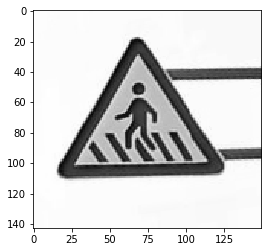

Actual : traveldirection
Predicted :  warning


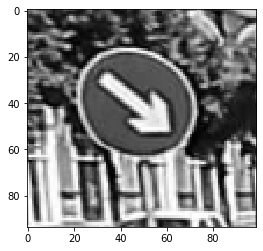

Actual : warning
Predicted :  laneend


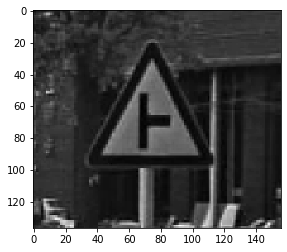

Actual : roundabout
Predicted :  roundabout


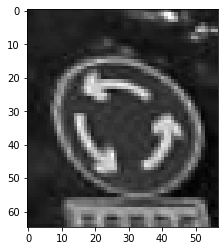

Actual : bicycle
Predicted :  bicycle


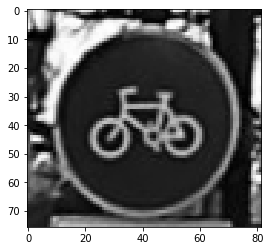

Actual : roundabout
Predicted :  roundabout


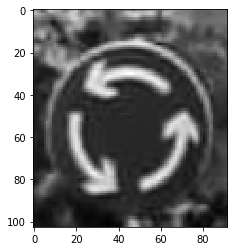

Actual : warning
Predicted :  warning


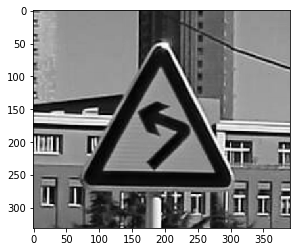

Actual : speed
Predicted :  speed


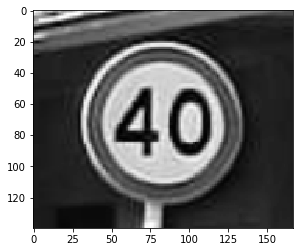

Actual : giveway
Predicted :  giveway


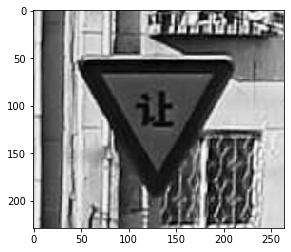

Actual : warning
Predicted :  warning


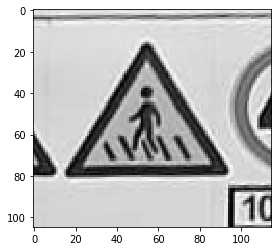

Actual : bicycle
Predicted :  bicycle


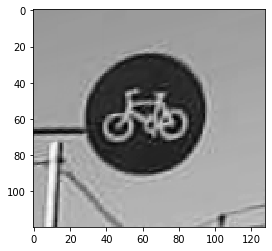

Actual : warning
Predicted :  warning


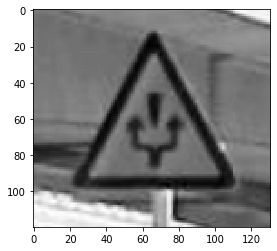

Actual : bicycle
Predicted :  bicycle


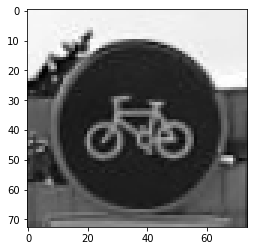

Actual : warning
Predicted :  warning


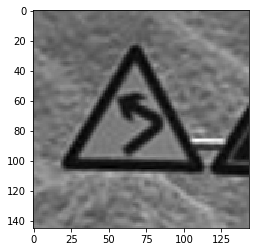

Actual : crossing
Predicted :  warning


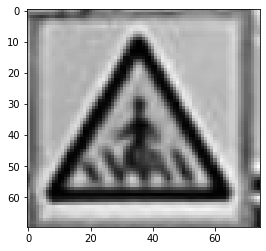

Actual : noparking
Predicted :  noparking


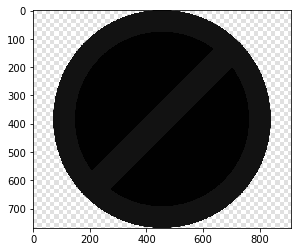

Actual : speed
Predicted :  speed


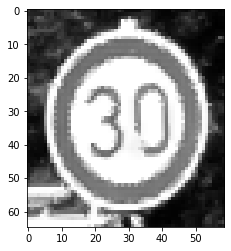

Actual : trafficdirective
Predicted :  noparking


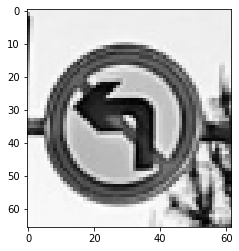

Actual : noentry
Predicted :  limitedtraffic


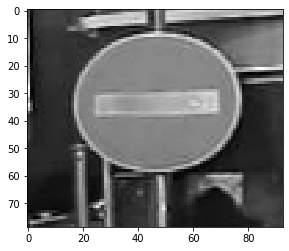

Actual : roundabout
Predicted :  roundabout


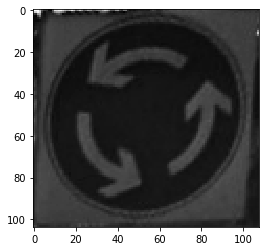

Actual : giveway
Predicted :  giveway


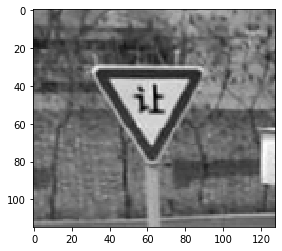

Actual : noentry
Predicted :  noentry


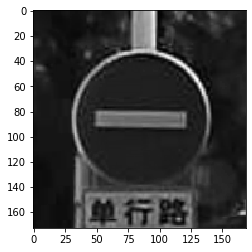

Actual : trafficdirective
Predicted :  speed


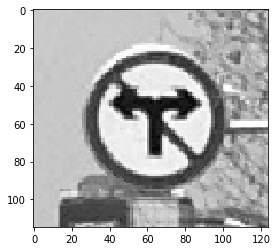

Actual : roundabout
Predicted :  roundabout


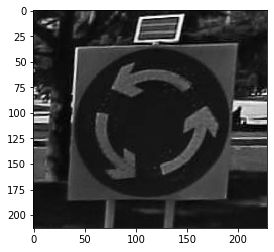

Actual : warning
Predicted :  warning


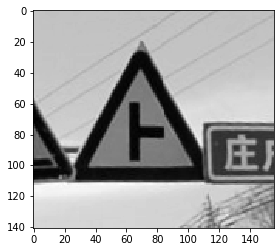

Actual : warning
Predicted :  warning


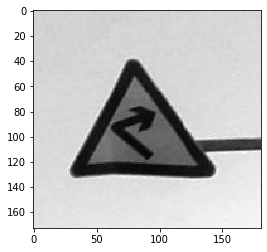

Actual : trafficdirective
Predicted :  rightofway


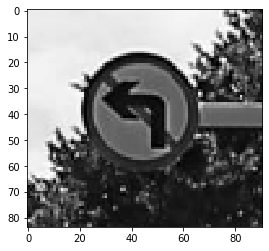

Actual : warning
Predicted :  warning


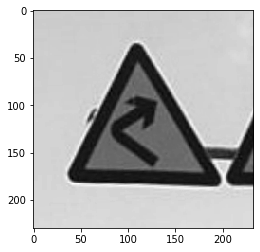

Actual : noentry
Predicted :  noentry


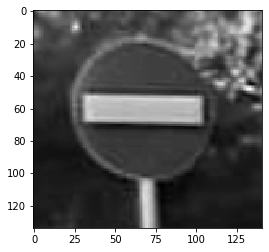

Actual : bicycle
Predicted :  bicycle


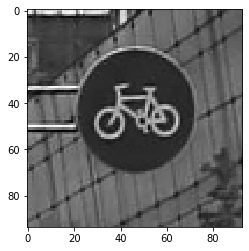

Actual : trafficdirective
Predicted :  speed


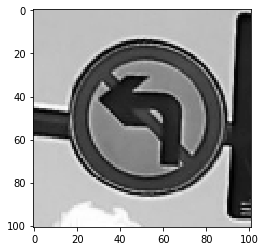

Actual : traveldirection
Predicted :  noparking


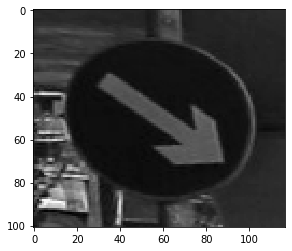

Actual : traveldirection
Predicted :  traveldirection


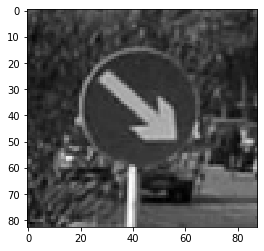

Actual : giveway
Predicted :  giveway


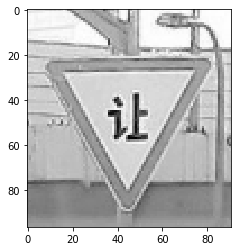

Actual : trafficdirective
Predicted :  speed


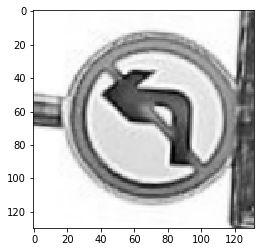

Actual : traveldirection
Predicted :  warning


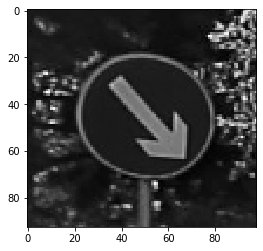

Actual : roundabout
Predicted :  warning


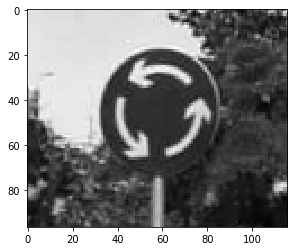

Actual : crossing
Predicted :  warning


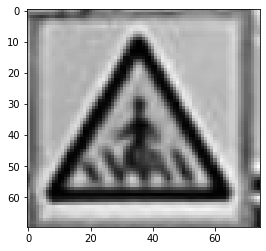

Actual : giveway
Predicted :  giveway


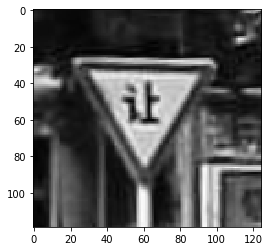

Actual : noentry
Predicted :  noentry


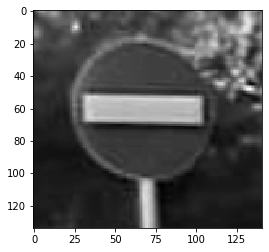

Actual : trafficdirective
Predicted :  trafficdirective


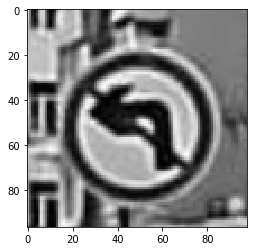

Actual : trafficdirective
Predicted :  traveldirection


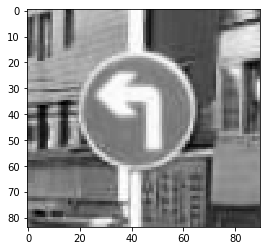

Actual : warning
Predicted :  warning


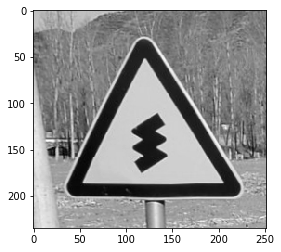

Actual : trafficdirective
Predicted :  warning


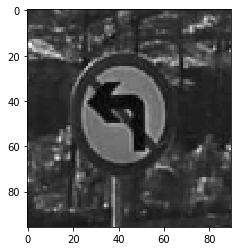

Actual : roundabout
Predicted :  roundabout


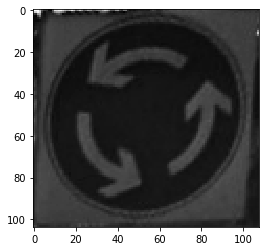

Actual : speed
Predicted :  speed


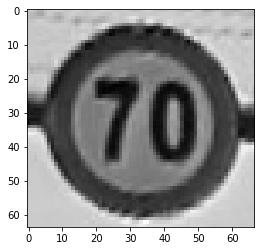

Actual : roundabout
Predicted :  rightofway


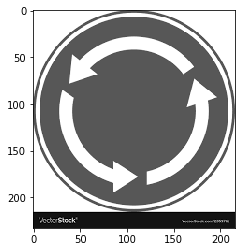

Actual : roundabout
Predicted :  warning


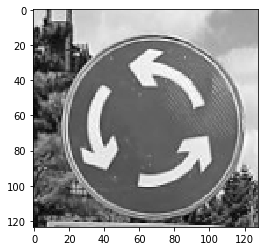

Actual : trafficdirective
Predicted :  speed


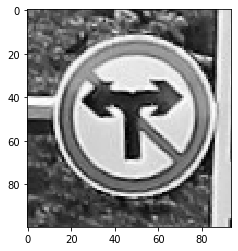

Actual : roundabout
Predicted :  roundabout


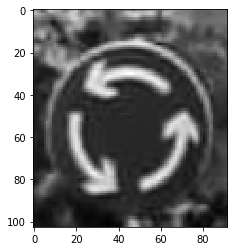

Actual : traveldirection
Predicted :  traveldirection


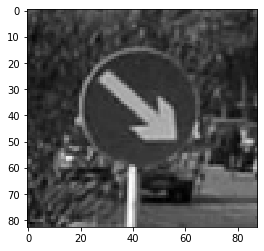

Actual : trafficdirective
Predicted :  speed


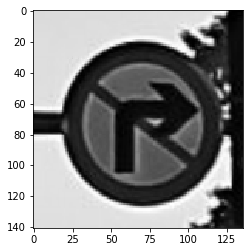

Actual : roundabout
Predicted :  roundabout


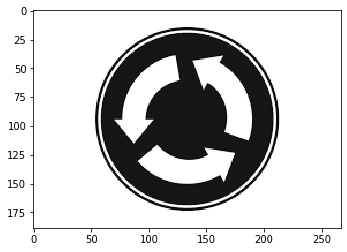

Actual : trafficdirective
Predicted :  trafficdirective


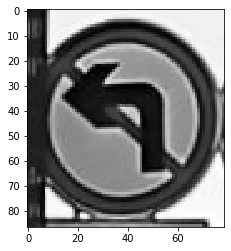

Actual : noentry
Predicted :  noentry


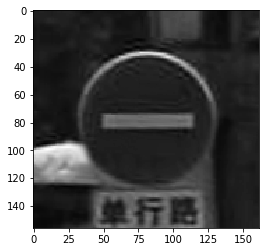

Actual : warning
Predicted :  warning


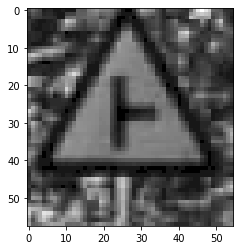

Actual : warning
Predicted :  warning


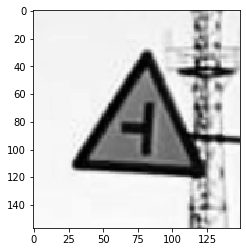

Actual : speed
Predicted :  bicycle


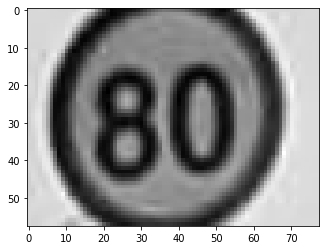

Actual : trafficdirective
Predicted :  trafficdirective


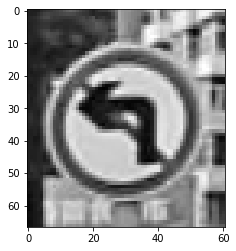

Actual : trafficdirective
Predicted :  bicycle


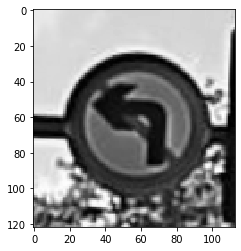

Actual : noentry
Predicted :  parking


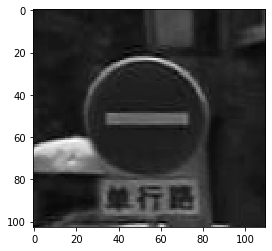

Actual : warning
Predicted :  warning


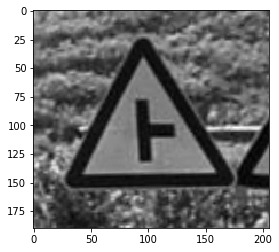

Actual : bicycle
Predicted :  warning


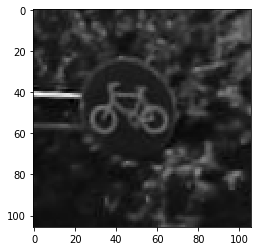

Actual : warning
Predicted :  warning


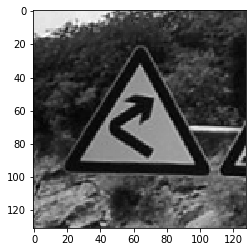

Actual : roundabout
Predicted :  roundabout


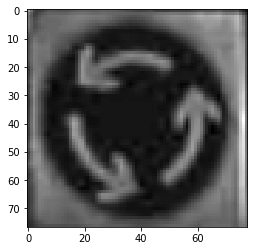

Actual : giveway
Predicted :  giveway


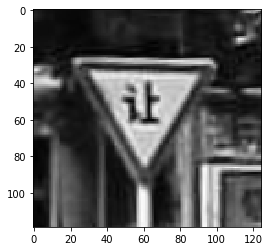

Actual : warning
Predicted :  warning


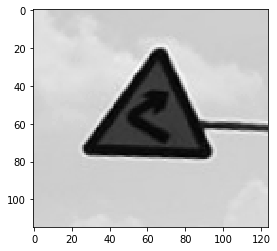

Actual : speed
Predicted :  speed


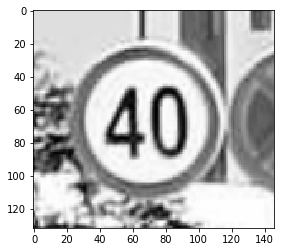

Actual : parking
Predicted :  parking


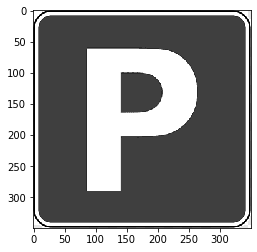

Actual : bicycle
Predicted :  bicycle


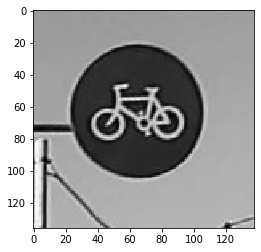

Actual : trafficdirective
Predicted :  trafficdirective


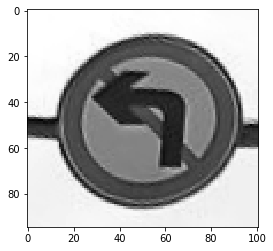

Actual : trafficdirective
Predicted :  speed


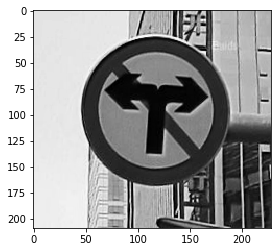

Actual : trafficdirective
Predicted :  speed


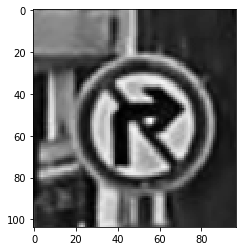

Actual : warning
Predicted :  warning


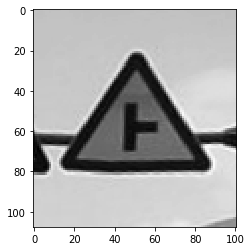

Actual : trafficdirective
Predicted :  speed


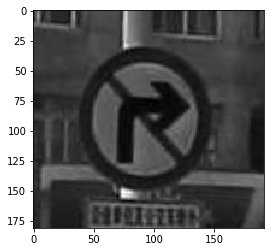

Actual : giveway
Predicted :  giveway


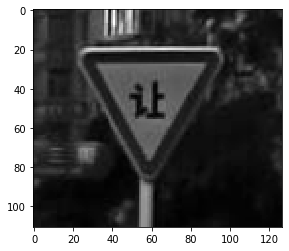

Actual : giveway
Predicted :  giveway


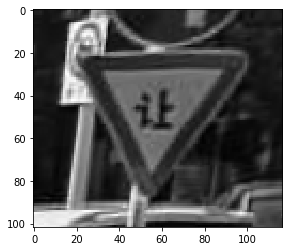

Actual : trafficdirective
Predicted :  trafficdirective


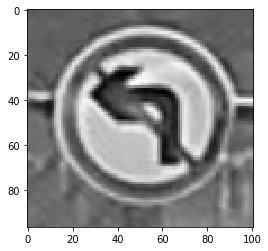

Actual : trafficdirective
Predicted :  speed


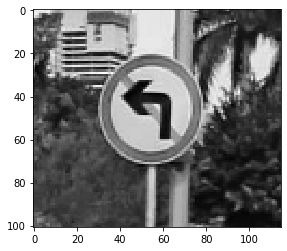

Actual : traveldirection
Predicted :  parking


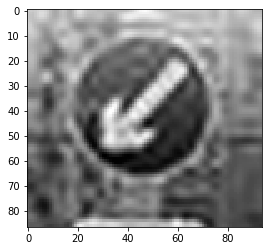

Actual : bicycle
Predicted :  bicycle


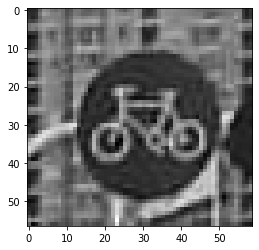

Actual : warning
Predicted :  warning


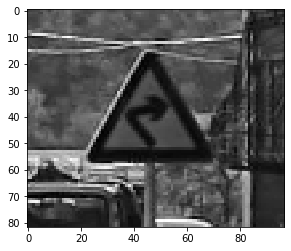

Actual : trafficdirective
Predicted :  bicycle


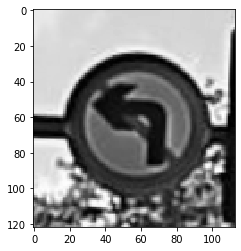

Actual : traveldirection
Predicted :  traveldirection


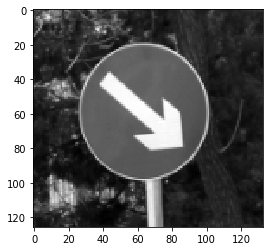

Actual : giveway
Predicted :  giveway


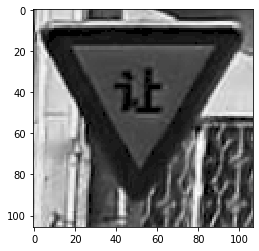

Actual : trafficdirective
Predicted :  speed


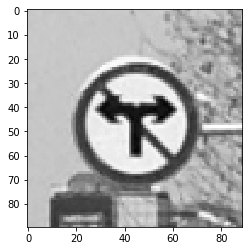

Actual : noentry
Predicted :  limitedtraffic


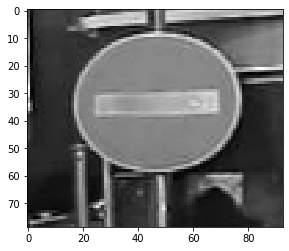

Actual : traveldirection
Predicted :  bicycle


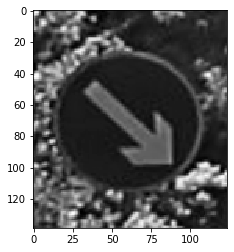

Actual : speed
Predicted :  speed


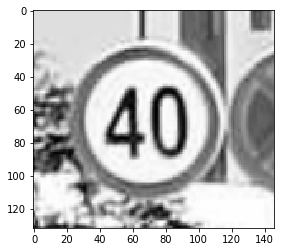

Actual : roundabout
Predicted :  roundabout


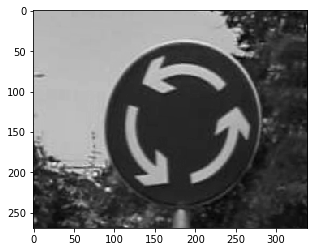

Actual : roundabout
Predicted :  warning


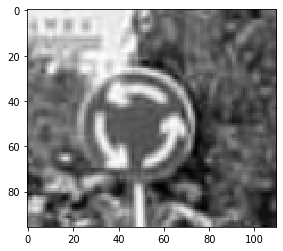

Actual : roundabout
Predicted :  roundabout


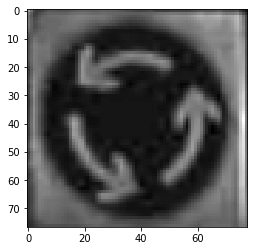

Actual : trafficdirective
Predicted :  trafficdirective


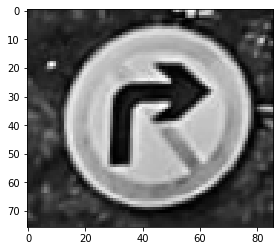

Actual : trafficdirective
Predicted :  roundabout


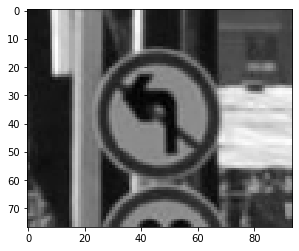

Actual : trafficdirective
Predicted :  speed


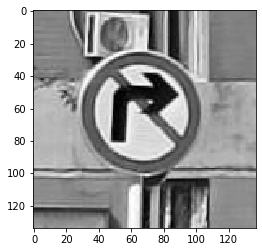

Actual : traveldirection
Predicted :  traveldirection


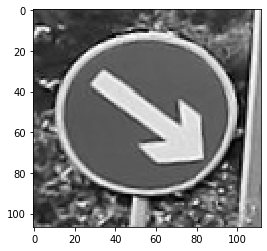

Actual : trafficdirective
Predicted :  trafficdirective


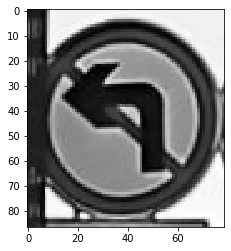

Actual : trafficdirective
Predicted :  speed


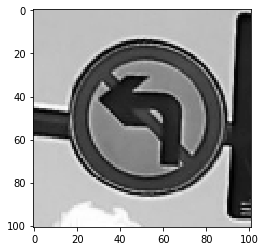

Actual : warning
Predicted :  warning


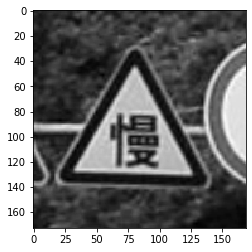

Actual : bicycle
Predicted :  bicycle


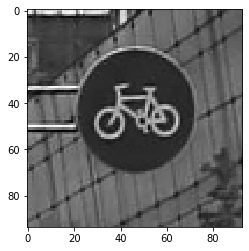

Actual : trafficdirective
Predicted :  noparking


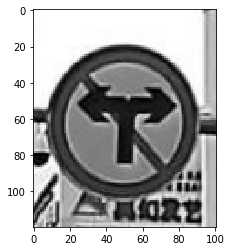

Actual : trafficdirective
Predicted :  trafficdirective


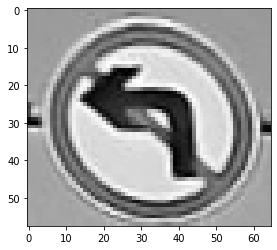

Actual : trafficdirective
Predicted :  trafficdirective


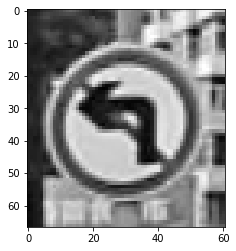

Actual : warning
Predicted :  warning


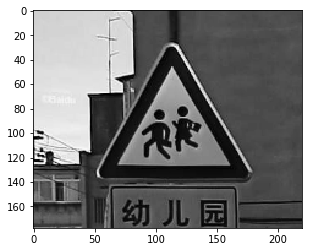

Actual : trafficdirective
Predicted :  speed


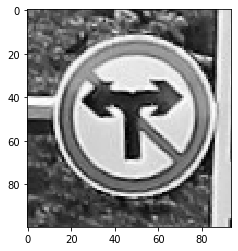

Actual : trafficdirective
Predicted :  speed


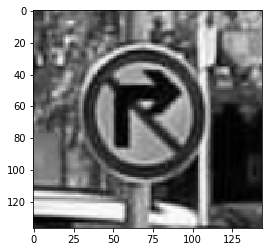

Actual : trafficdirective
Predicted :  speed


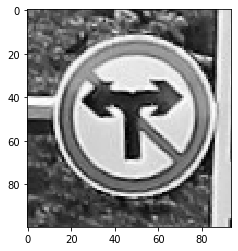

Actual : trafficdirective
Predicted :  speed


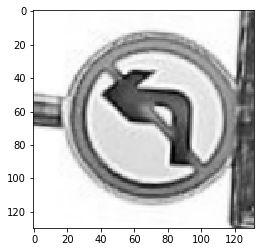

Actual : trafficdirective
Predicted :  speed


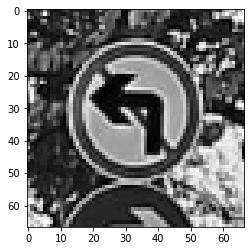

Actual : trafficdirective
Predicted :  trafficdirective


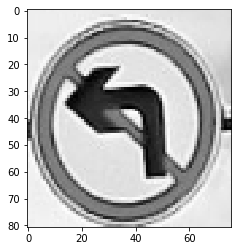

Actual : noentry
Predicted :  rightofway


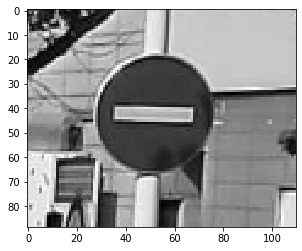

Actual : crossing
Predicted :  warning


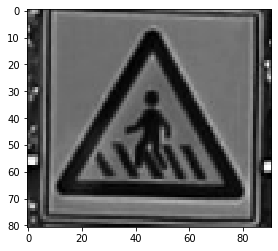

Actual : noentry
Predicted :  noentry


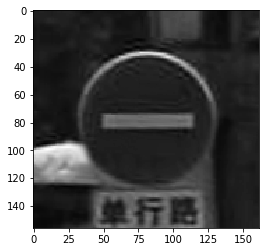

Actual : noparking
Predicted :  roundabout


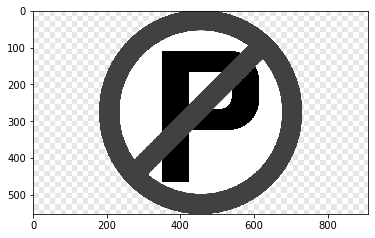

Actual : warning
Predicted :  warning


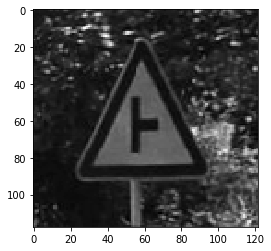

Actual : bicycle
Predicted :  bicycle


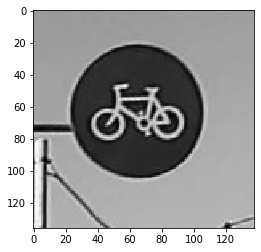

Actual : warning
Predicted :  warning


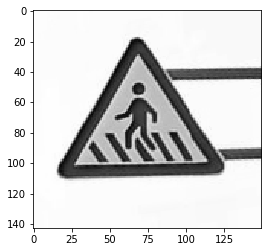

Actual : giveway
Predicted :  speed


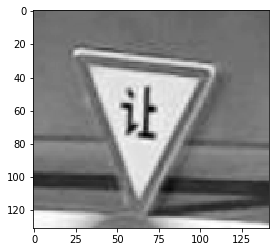

Actual : roundabout
Predicted :  warning


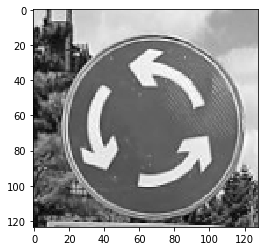

Actual : speed
Predicted :  speed


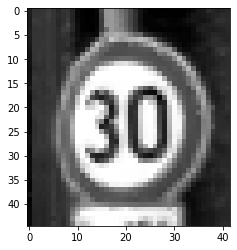

Actual : bicycle
Predicted :  bicycle


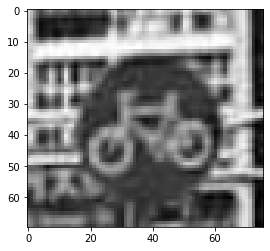

Actual : bicycle
Predicted :  bicycle


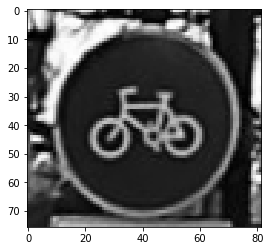

Actual : speed
Predicted :  speed


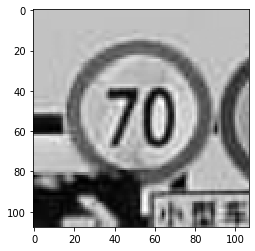

Actual : giveway
Predicted :  speed


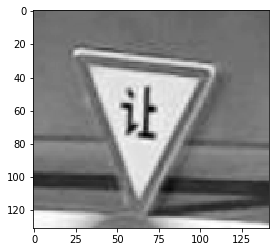

Actual : trafficdirective
Predicted :  speed


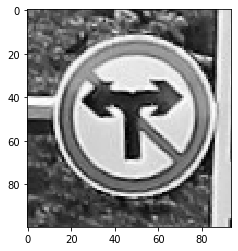

Actual : warning
Predicted :  warning


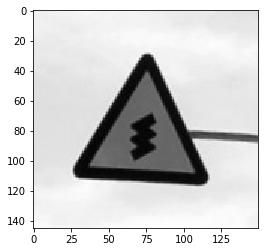

Actual : noentry
Predicted :  noentry


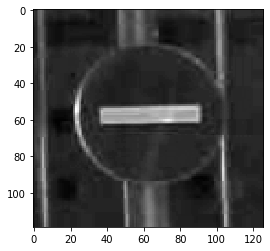

Actual : trafficdirective
Predicted :  speed


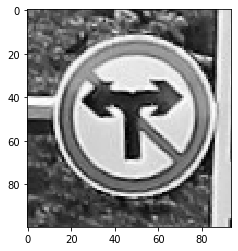

Actual : crossing
Predicted :  warning


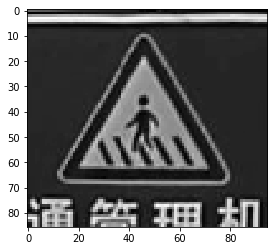

Actual : bicycle
Predicted :  bicycle


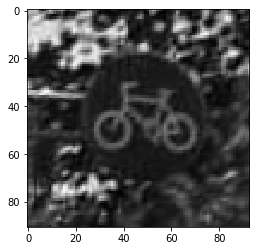

Actual : roundabout
Predicted :  roundabout


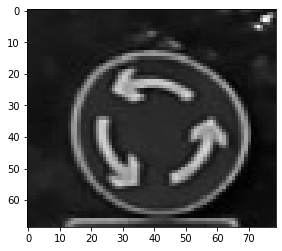

Actual : trafficdirective
Predicted :  speed


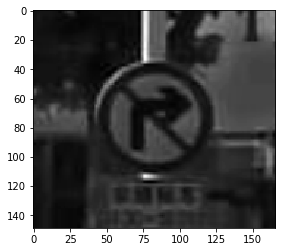

Actual : roundabout
Predicted :  roundabout


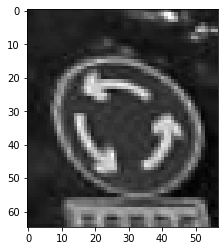

Actual : trafficdirective
Predicted :  trafficdirective


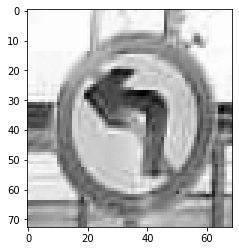

Actual : bicycle
Predicted :  warning


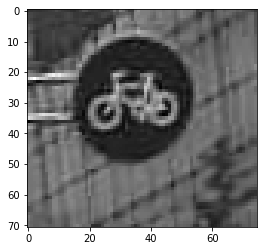

Actual : traveldirection
Predicted :  giveway


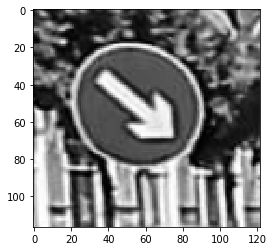

Actual : crossing
Predicted :  warning


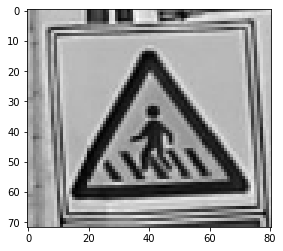

Actual : noentry
Predicted :  noentry


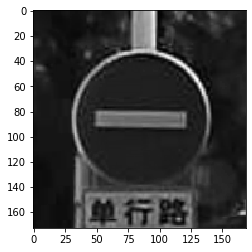

Actual : crossing
Predicted :  warning


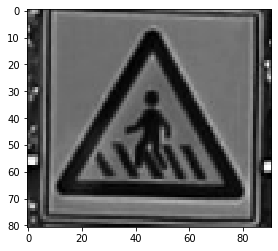

Actual : warning
Predicted :  warning


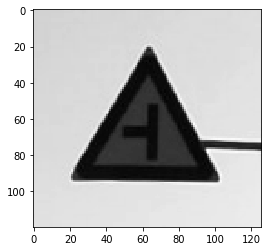

Actual : trafficdirective
Predicted :  speed


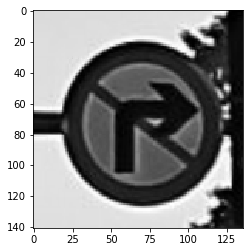

Actual : traveldirection
Predicted :  traveldirection


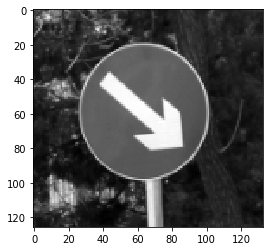

Actual : traveldirection
Predicted :  parking


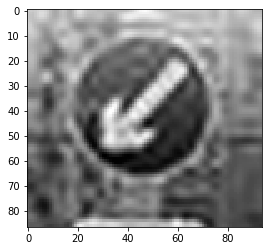

Actual : roundabout
Predicted :  warning


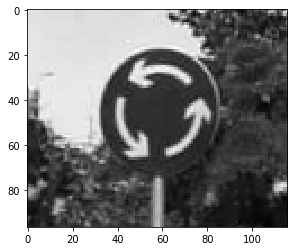

Actual : trafficdirective
Predicted :  trafficdirective


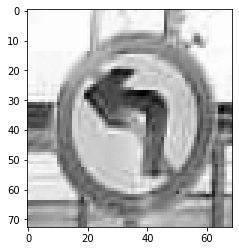

Actual : roundabout
Predicted :  roundabout


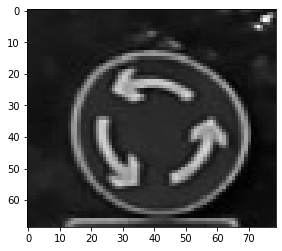

Actual : trafficdirective
Predicted :  trafficdirective


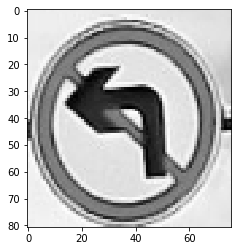

Actual : trafficdirective
Predicted :  trafficdirective


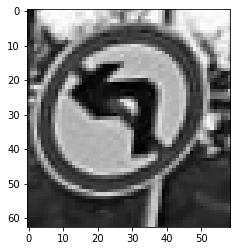

Actual : parking
Predicted :  parking


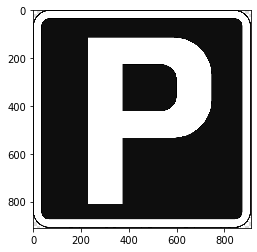

Actual : bicycle
Predicted :  warning


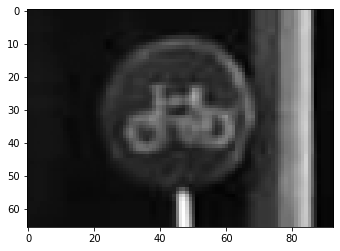

Actual : crossing
Predicted :  warning


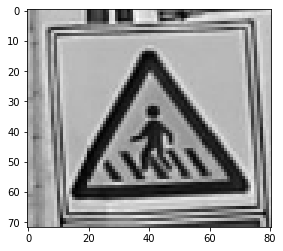

Actual : traveldirection
Predicted :  noparking


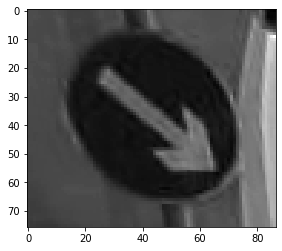

Actual : trafficdirective
Predicted :  speed


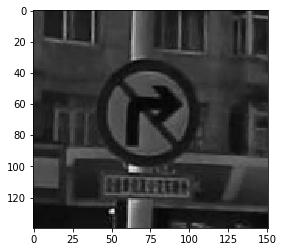

Actual : trafficdirective
Predicted :  trafficdirective


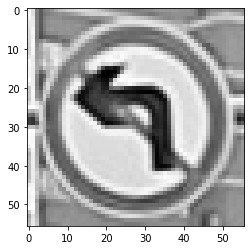

Actual : warning
Predicted :  warning


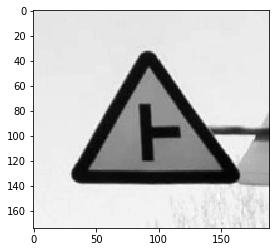

Actual : speed
Predicted :  speed


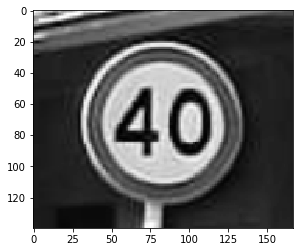

Actual : warning
Predicted :  warning


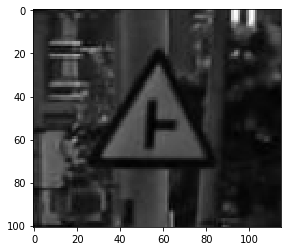

Actual : trafficdirective
Predicted :  warning


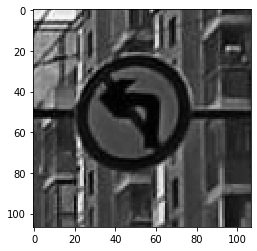

Actual : bicycle
Predicted :  bicycle


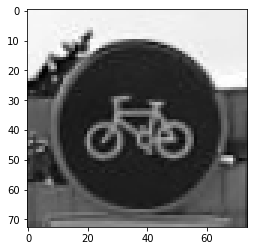

Actual : trafficdirective
Predicted :  speed


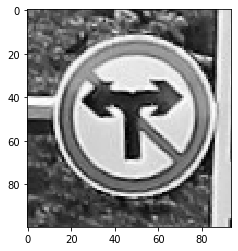

Actual : speed
Predicted :  speed


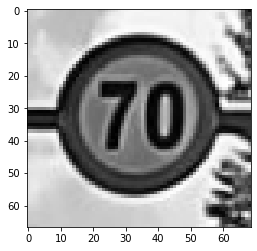

Actual : trafficdirective
Predicted :  traveldirection


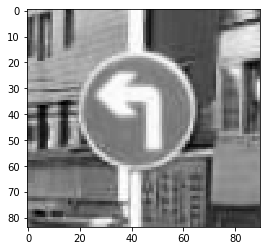

Actual : trafficdirective
Predicted :  trafficdirective


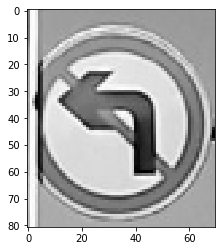

Actual : parking
Predicted :  parking


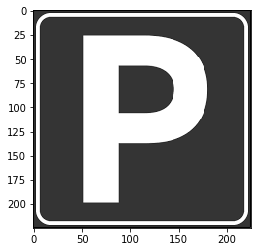

Actual : warning
Predicted :  warning


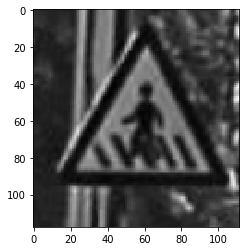

Actual : giveway
Predicted :  giveway


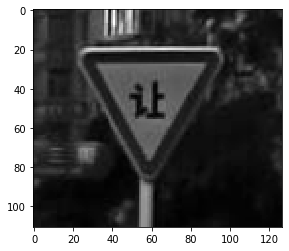

Actual : roundabout
Predicted :  roundabout


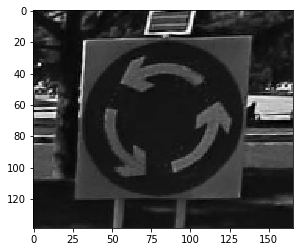

Actual : traveldirection
Predicted :  traveldirection


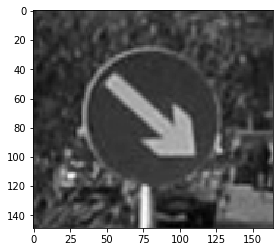

Actual : trafficdirective
Predicted :  trafficdirective


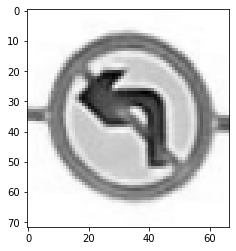

Actual : crossing
Predicted :  warning


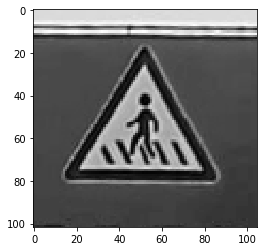

Actual : noentry
Predicted :  traveldirection


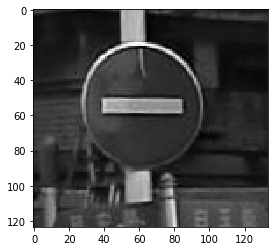

Actual : traveldirection
Predicted :  traveldirection


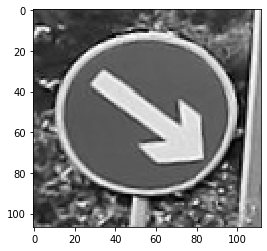

Actual : trafficdirective
Predicted :  noparking


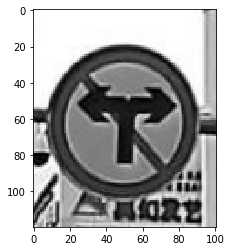

Actual : trafficdirective
Predicted :  warning


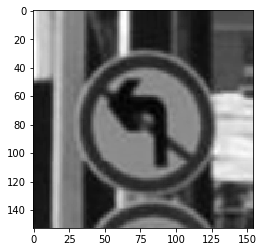

Actual : traveldirection
Predicted :  traveldirection


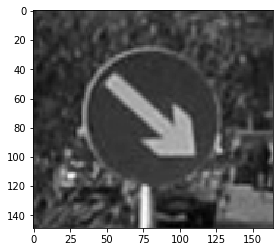

In [82]:
# Randomly displaying sign image from our independent data set
y_predicted_sign = []
for row in test_df.itertuples(index=True, name='Pandas'):
    test_img = cv2.imread(row.path, cv2.IMREAD_GRAYSCALE)
    plt.imshow(test_img, cmap = 'gray')
    
    test_img = cv2.resize(test_img, (28, 28))
    test_img = test_img[..., np.newaxis]
    test_img = test_img[np.newaxis, ].astype(np.float)
    test_img /= 255.0
    
    temp = np.argmax(sign_model.predict(test_img))
    y_predicted_sign.append(le_sign.classes_[temp])
    print ("Actual :", row.sign)
    print ("Predicted : ", le_sign.classes_[temp])
    plt.show()

In [83]:
# Displaying f1 score on sign dataset
print ("F1 score on sign test set : ",f1_score(test_df['sign'].tolist(), y_predicted_sign, average = 'micro'))

F1 score on sign test set :  0.6043956043956044
